# LAB 06 Assigment

Dominik Breksa (dominikbreksa@student.agh.edu.pl)

In [18]:
"""LAB 06 Assigment Solution Notebook"""

from types import SimpleNamespace
from functools import partial

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import scipy
from open_atmos_jupyter_utils import show_plot, show_anim

plt.rcParams['axes.grid'] = True

...

In [19]:
DTYPE = np.float64

In [20]:
NX = 75
X, DX = np.linspace(0., 12., num=NX, dtype=DTYPE, retstep=True, endpoint=True)

NY = 50
Y, DY = np.linspace(0., 6., num=NY, dtype=DTYPE, retstep=True, endpoint=True)

NT = 75
T, DT = np.linspace(0., 8., num=NT, dtype=DTYPE, retstep=True, endpoint=True)

In [21]:
X_SPEED = 1
Y_SPEED = 0.5

In [22]:
N_PART = 10_000
N_REAL = 10_000_000

In [23]:
A = 1.
X_0 = 2.
Y_0 = 2.
SIGMA_X = 0.5
SIGMA_Y = 0.5

In [24]:
X_SCIPY_RNG = scipy.stats.norm(loc=X_0, scale=SIGMA_X)
Y_SCIPY_RNG = scipy.stats.norm(loc=Y_0, scale=SIGMA_Y)
XY_SCIPY_RNG = scipy.stats.multivariate_normal(mean=(X_0, Y_0), cov=((SIGMA_X, 0.),
                                                                     (0., SIGMA_Y)))
NP_RNG = np.random.default_rng(seed=44)

In [25]:
def initial_conditions(x, y):
    """https://en.wikipedia.org/wiki/Gaussian_function"""
    return A * np.exp(-(((x - X_0) ** 2 / 2 / SIGMA_X ** 2) + ((y - Y_0) ** 2 / 2 / SIGMA_Y ** 2)))

In [33]:
def sample():
    """ samples a particle population specified onto a grid and returns
    a collection indexed by sampling type, with values composed of `cell` and `mult`
    integer-valued arrays with cell IDs and multiplicities, respectively """

    u01_x = NP_RNG.uniform(0., 1., N_PART)
    u01_y = NP_RNG.uniform(0., 1., N_PART)

    span_x = X.max() - X.min()
    span_y = Y.max() - Y.min()

    return {
        k: {
            'cell_x': (v['cell_x'] / DX).astype(int),
            'cell_y': (v['cell_y'] / DY).astype(int),
            'mult': np.round(v['mult'] * N_REAL).astype(int),
        }
        for k,v in
        {
            'sampling: uniform random in space': {
                'cell_x': u01_x * span_x,
                'cell_y': u01_y * span_y,
                'mult': XY_SCIPY_RNG.pdf(np.dstack((u01_x * span_x, u01_y * span_y))) * span_x * span_y / N_PART,
            },
            'sampling: constant multiplicity': {
                'cell_x': X_SCIPY_RNG.ppf(u01_x),
                'cell_y': Y_SCIPY_RNG.ppf(u01_y),
                'mult': np.ones(shape=(N_PART,), dtype=DTYPE) / N_PART,
            },
        }.items()
    }

PARTICLES = sample()

In [40]:
def plot(*, particles):
    """ ... """
    fig, axs = plt.subplot_mosaic([['hist_x', '.'],
                                   ['scatter', 'hist_y']],
                                  sharex=True,
                                  sharey=True,
                                  figsize=(12, 8),
                                  width_ratios=(4, 1), height_ratios=(1, 4),
                                  tight_layout=True,)

    u01_x = NP_RNG.uniform(-0.5, 0.5, N_PART)
    u01_y = NP_RNG.uniform(-0.5, 0.5, N_PART)

    for k in particles:
        # axs['hist'].hist(
        #     x=particles[k]['cell'],
        #     weights=particles[k]['mult'] / N_REAL,
        #     bins=n_cell,
        #     range=(0, n_cell),
        #     label=f'{k}',
        #     alpha=.666
        # )
        axs['scatter'].scatter(
            x=particles[k]['cell_x'] + u01_x,
            y=particles[k]['cell_y'] + u01_y,
            s=.25 + particles[k]['mult'] * N_PART / N_REAL / 2
        )

    axs['scatter'].set_xlabel('x / Δx')
    axs['scatter'].set_ylabel('y / Δy')
    # axs['scatter'].set_aspect('equal')

    show_plot(fig=fig)

plot(particles=PARTICLES)

### Analytical solution for 2d advection equation

[SOURCE](https://math.stackexchange.com/questions/2172242/solution-to-a-two-dimensional-transport-pde)
[SOURCE 2](https://www.youtube.com/watch?v=IsVW2nsGE3E&t=6s)

In [28]:
def analytical_solution(x, y, t, x_speed, y_speed):
    return initial_conditions(x - x_speed * t, y - y_speed * t)

In [29]:
ANALYTICAL_SOL = partial(analytical_solution, x_speed=X_SPEED, y_speed=Y_SPEED)

In [30]:
X, Y = np.meshgrid(X, Y)
# z = analytical_solution(X, Y, index / 10)

# z = (1 / (1 + X ** 2) + 1 / (1 + Y ** 2)) / 2
# z = (1 / (1 + np.exp(X)) + 1 / (1 + np.exp(Y))) / 2
# z = (np.cos(X) ** 2 + np.cos(Y) ** 2) / 2
# z = (0.5 / X + 0.5 / Y) / 2
def plot(index):
    z = ANALYTICAL_SOL(X, Y, index / 10)

    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={"projection": "3d"})

    ax.plot_surface(X, Y, z, edgecolor='white', lw=0.5, rstride=16, cstride=16, alpha=0.3)
    ax.contourf(X, Y, z, zdir='z', offset=-2, cmap='coolwarm')
    ax.contourf(X, Y, z, zdir='x', offset=-5, cmap='coolwarm')
    ax.contourf(X, Y, z, zdir='y', offset=12, cmap='coolwarm')

    ax.set(xlim=(-5, 13), ylim=(-4, 13), zlim=(-2, 2),
           xlabel='X', ylabel='Y', zlabel='Z')

    fig.tight_layout()

    return fig


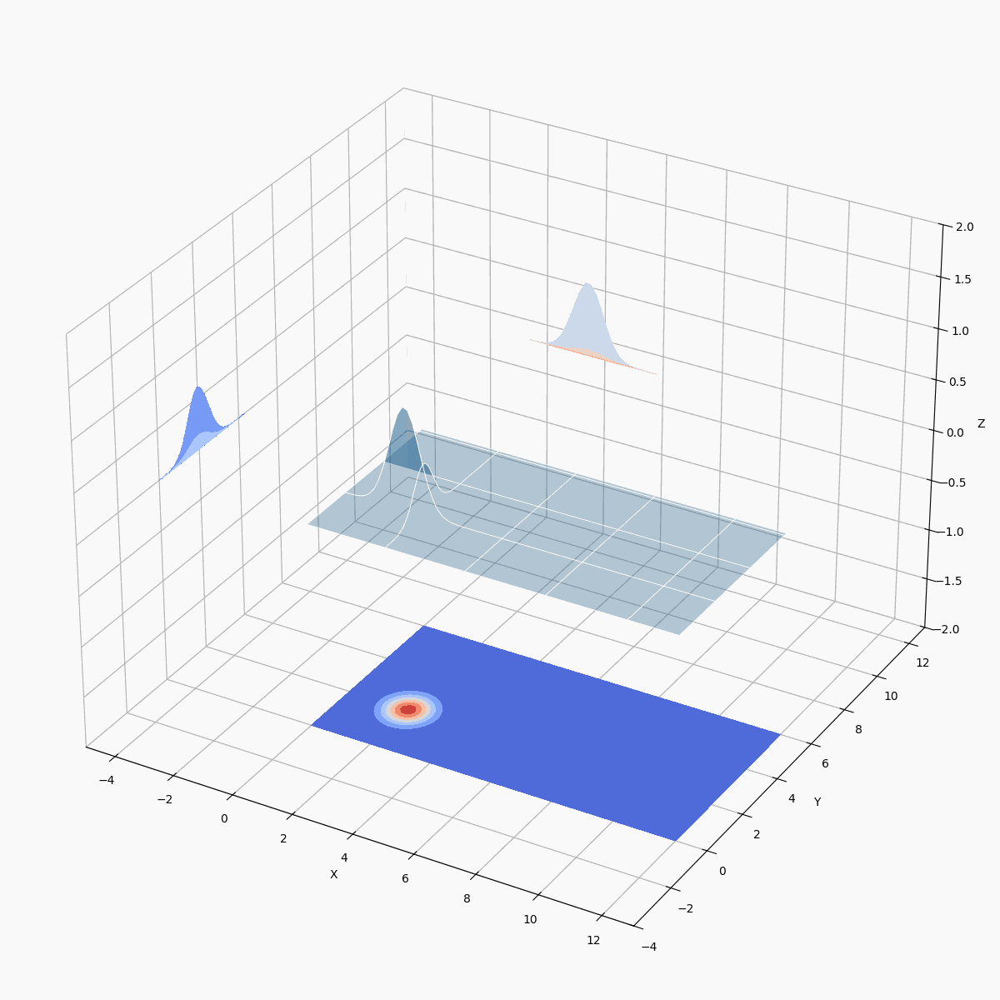

HTML(value="<a href='.\\tmp0uz70g8f.gif' target='_blank'>.\\tmp0uz70g8f.gif</a><br>")

In [31]:
show_anim(plot, range(0, 50, 2))

### Numerical solution for 2d advection equation using monte carlo sampling

[SOURCE](http://www-vendruscolo.ch.cam.ac.uk/muller2016.pdf)

ValueError: operands could not be broadcast together with shapes (3750,1,6) (300,4) 

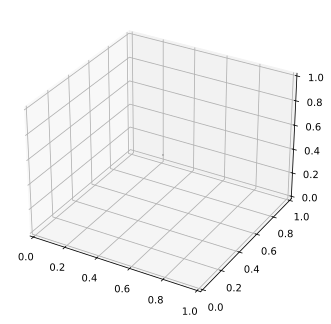

In [32]:
# set up the figure and Axes
fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(121, projection='3d')

# X, Y = np.meshgrid(X, Y)
# x, y = X.ravel(), Y.ravel()

top = ANALYTICAL_SOL(X, Y, 0)
bottom = np.zeros_like(top)
width = depth = 1

ax1.bar3d(X, Y, bottom, width, depth, top, shade=True)
ax1.set_title('Shaded')

In [ ]:
def flow_field(nx, dx, ny, dy, dt):
    """Creates a flow field for every cell"""
    assert 0. < (x_courant_num := X_SPEED * dt / dx) <= 1.
    assert 0. < (y_courant_num := Y_SPEED * dt / dy) <= 1.

    flow_field_data = (
        np.full((nx, ny), x_courant_num, dtype=DTYPE),
        np.full((nx, ny), y_courant_num, dtype=DTYPE),
    )

    return np.concat(flow_field_data, axis=-1, dtype=DTYPE)

In [ ]:
def plot(*, particles, params_p, params_x, rng, title='', shift=0):
    """ plots the particle state as both a histogram as well as population scatter plot
    (with random coordinates shuffled for the purpose of plotting) """
    _, axs = pyplot.subplot_mosaic(
        [['hist'], ['part']],
        figsize=(11, 6),
        sharex=True,
        tight_layout=True,
    )
    u01 = rng.uniform(0, 1, params_p.n_part)
    scale = params_p.norm / params_p.n_part
    for k in particles:
        axs['hist'].hist(
            x=particles[k]['cell'],
            weights=particles[k]['mult'] / params_p.norm,
            bins=params_x.n_cell,
            range=(0, params_x.n_cell),
            label=f'{k}',
            alpha=.666
        )
        axs['part'].scatter(
            particles[k]['cell'] + u01,
            tuple(reversed(u01)),
            s=.25 + 2 * particles[k]['mult'] / scale
        )
    pdf_x = np.linspace(0, params_x.span, 256)
    pdf_y = params_p.dist.pdf(pdf_x - shift)
    axs['hist'].plot(pdf_x / params_x.step, pdf_y * params_x.step, color='black', label='analytic')
    axs['hist'].set_xlim(0, params_x.n_cell)
    axs['hist'].legend()
    axs['hist'].set_ylabel('pdf(x) ⋅ Δx [1]')
    axs['hist'].set_title(title or f'{params_p.n_part=}   {params_x.n_cell=}')
    axs['part'].set_xticks(np.arange(params_x.n_cell + 1))
    axs['part'].xaxis.set_tick_params(rotation=75)
    axs['part'].set_xlabel('x / Δx [1]')
    axs['part'].set_yticks([])
    axs['part'].set_ylim(0,1)
    for axes in axs.values():
        axes.grid()
    show_plot()

plot(particles=PARTICLES, params_p=PARAMS_P, params_x=PARAMS_X, rng=RNG)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

x, y = np.mgrid[-1:1:.01, -1:1:.01]
pos = np.dstack((x, y))
rv = multivariate_normal([0., 0.], [[1.0, 0.],
                                    [0., 1.0]])
fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.contourf(x, y, rv.pdf(pos))

##

Project

4/5 slides
2 last classes
8–10 min max presentation
send presentation
Do not share slides outside

final project
design knowledge management plan for a company institution
4 page with plot summary of a report individually

problems, how to solve them any organisation. Weekly meetings